References:
- https://www.kaggle.com/code/ashishpatel26/gan-beginner-tutorial-for-pytorch-celeba-dataset


### Import packages

In [1]:
import os
import torch
from torchvision import transforms
from torchvision.datasets import CelebA
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
%matplotlib inline

### Hyperparameters

In [2]:
image_size = 80
batch_size_train = 1000
batch_size_val = 1000
num_workers = 0
shuffle_loader = True
root = 'datasets/'
TARGET_ATTR = 'Eyeglasses' #'Wearing_Hat', 'Bald', 'Bangs', 'Eyeglasses', 'Male', 'No_Beard', 'Smiling', 'Young', 

In [3]:
ATTR = "5_o_Clock_Shadow Arched_Eyebrows Attractive Bags_Under_Eyes Bald Bangs Big_Lips Big_Nose Black_Hair Blond_Hair Blurry Brown_Hair Bushy_Eyebrows Chubby Double_Chin Eyeglasses Goatee Gray_Hair Heavy_Makeup High_Cheekbones Male Mouth_Slightly_Open Mustache Narrow_Eyes No_Beard Oval_Face Pale_Skin Pointy_Nose Receding_Hairline Rosy_Cheeks Sideburns Smiling Straight_Hair Wavy_Hair Wearing_Earrings Wearing_Hat Wearing_Lipstick Wearing_Necklace Wearing_Necktie Young"
ATTR = {attr: attr_idx for attr_idx, attr in enumerate(ATTR.split(' '))}
target_attr_index = ATTR[TARGET_ATTR]
target_attr_index

15

### Load Dataset & Create dataloader

In [4]:
transform = transforms.Compose([
    # transforms.Resize(image_size),
    # transforms.CenterCrop(image_size),
    # transforms.Grayscale(1),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# order = list(range(160000))
# import random
# random.seed(0)
# random.shuffle(order)

# dataset_train = Subset(CelebA(root=root, split='train', transform=transform, target_type='attr', download=False), order)
dataset_train = CelebA(root=root, split='train', transform=transform, target_type='attr', download=False)
dataset_val = CelebA(root=root, split='valid', transform=transform, target_type='attr', download=False)

In [5]:
loader_train = DataLoader(dataset=dataset_train, batch_size=batch_size_train, shuffle=shuffle_loader, num_workers=num_workers, drop_last=False)
loader_val = DataLoader(dataset=dataset_val, batch_size=batch_size_val, shuffle=False, num_workers=num_workers, drop_last=False)

In [6]:
attr_true_list_train = []
attr_false_list_train = []
cnt = [15, 30]
for i, (im, lab) in enumerate(loader_train):
    for j, l in enumerate(lab[...,target_attr_index]):
        if l==1 and cnt[1] > 0:
            attr_true_list_train.append(j)
            cnt[1] -= 1
        elif l==0 and cnt[0] > 0:
            attr_false_list_train.append(j)
            cnt[0] -= 1
    if sum(cnt) == 0 : break
print(attr_true_list_train)
print(attr_false_list_train)

[2, 18, 40, 50, 80, 88, 93, 116, 118, 127, 134, 173, 200, 216, 224, 240, 252, 273, 278, 306, 330, 374, 384, 405, 414, 443, 448, 451, 464, 494]
[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


In [7]:
attr_true_list_val = []
attr_false_list_val = []
cnt = [15, 30]
for i, (im, lab) in enumerate(loader_val):
    for j, l in enumerate(lab[...,target_attr_index]):
        if l==1 and cnt[1] > 0:
            attr_true_list_val.append(j)
            cnt[1] -= 1
        elif l==0 and cnt[0] > 0:
            attr_false_list_val.append(j)
            cnt[0] -= 1
    if sum(cnt) == 0 : break
print(attr_true_list_val)
print(attr_false_list_val)

[15, 25, 36, 45, 62, 74, 96, 105, 114, 118, 126, 128, 136, 162, 167, 171, 172, 185, 187, 200, 223, 241, 249, 255, 256, 298, 310, 318, 332, 373]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


In [8]:
len(dataset_train), len(dataset_val)

(162770, 19867)

### Example of visualization

tensor([0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1])
torch.Size([1000, 3, 218, 178])


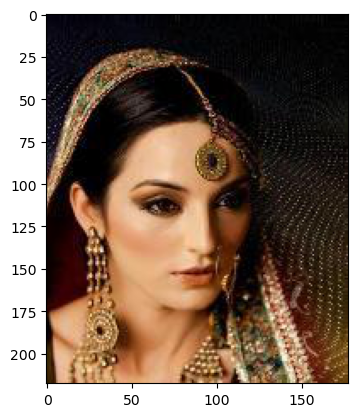

In [9]:
denorm = transforms.Normalize((-1,),(2,))

def im_show(img, ax=None):
    img_denorm = denorm(img)
    img_t = torch.permute(img_denorm, (1,2,0))
    if ax is not None:
        ax.imshow(img_t)
    else:
        plt.imshow(img_t)

img_example, label_example = next(iter(loader_train))

im_show(img_example[0])
print(label_example[0])
print(img_example.shape)

In [10]:
from tqdm.auto import tqdm
def comparison_figure(pca, dataset, indices, save_name):
    fig, axes = plt.subplots(2, len(indices), figsize=(2.6*len(indices), 5))
    
    for i, img_ind in tqdm(enumerate(indices)):
        img, _ = dataset[img_ind]
        projected = pca.transform(img).cpu()
        im_show(img, axes[0][i])
        im_show(projected[0], axes[1][i])
        axes[0][i].axis('off')
        axes[1][i].axis('off')

    axes[0][0].set_ylabel('Original')
    axes[1][0].set_ylabel('Results')
    fig.tight_layout(pad=0)
    fig.savefig(os.path.join('figures',save_name))

### Run PCA - Vanilla

In [11]:
from fair_streaming_pca_pytorch import FairStreamingPCA

torch.manual_seed(0)
pca_vanilla = FairStreamingPCA(TARGET_ATTR, device='mps')
pca_vanilla.fit(
    dataset=dataset_train,
    target_unfair_dim=None,
    target_pca_dim=1000,
    n_iter_unfair=None,
    n_iter_pca=5,
    block_size_unfair=None,
    block_size_pca=32000,
    batch_size=batch_size_train,
    constraint='vanilla',
    unfairness_frequent_direction=True,
    verbose=True,
    seed=0
)

# pca_vanilla.transform(loader=loader_val)
# print("Exp Var Ratio:", pca_vanilla.explained_variance_ratio)
# print("Exp Var Ratio - Group 0:", pca_vanilla.explained_variance_ratio_group[0])
# print("Exp Var Ratio - Group 1:", pca_vanilla.explained_variance_ratio_group[1])
# print("Exp Var Ratio Difference:", pca_vanilla.explained_variance_ratio_group[0] - pca_vanilla.explained_variance_ratio_group[1])
# os.mkdir('Tensors/rgb_base/')
torch.save(pca_vanilla.V, 'Tensors/rgb_base/V_vanilla.pt')

PCA::   0%|          | 0/5 [00:00<?, ?it/s]

PCA(1/5)::   0%|          | 0/32 [00:00<?, ?it/s]

PCA(2/5)::   0%|          | 0/32 [00:00<?, ?it/s]

PCA(3/5)::   0%|          | 0/32 [00:00<?, ?it/s]

PCA(4/5)::   0%|          | 0/32 [00:00<?, ?it/s]

PCA(5/5)::   0%|          | 0/32 [00:00<?, ?it/s]

In [12]:
# img_example, label_example = next(iter(loader_val))
# index = 15
# print(label_example[index][pca_vanilla.a]==1)
# projected = pca_vanilla.transform(img_example[index]).cpu()
# fig, ax = plt.subplots(1,2)
# im_show(projected[0], ax[0])
# im_show(img_example[index], ax[1])
# ax[0].title.set_text('PCA')
# ax[1].title.set_text('Original')
# fig.savefig('out_vanilla.pdf')


In [ ]:
# pca_vanilla = FairStreamingPCA(TARGET_ATTR, device='mps')
# pca_vanilla.V = torch.load('Tensors/rgb_base/V_vanilla.pt').to(pca_vanilla.device)

In [13]:
# index = 15
# img_example, label_example = dataset_val[index]
# buffer_V = pca_vanilla.buffer_V
# fig, axes = plt.subplots(1, len(buffer_V), figsize=(5*len(buffer_V), 5))
# for i, V in enumerate(buffer_V):
#     pca_vanilla.V = V
#     projected_img = pca_vanilla.transform(img_example).cpu()
#     im_show(projected_img[0], axes[i])
    

### Run PCA - All

In [ ]:
from fair_streaming_pca_pytorch import FairStreamingPCA

torch.manual_seed(0)
pca_all = FairStreamingPCA(TARGET_ATTR, device='cpu')
pca_all.fit(
    dataset=dataset_train,
    target_unfair_dim=2,
    target_pca_dim=1000,
    n_iter_unfair=5,
    n_iter_pca=5,
    block_size_unfair=32000,
    block_size_pca=32000,
    batch_size=batch_size_train,
    constraint='all',
    unfairness_frequent_direction=False,
    verbose=False,
    seed=0,
    save_V=False
)

# pca_all.transform(loader=loader_val,)
# print("Exp Var Ratio:", pca_all.explained_variance_ratio)
# print("Exp Var Ratio - Group 0:", pca_all.explained_variance_ratio_group[0])
# print("Exp Var Ratio - Group 1:", pca_all.explained_variance_ratio_group[1])
# print("Exp Var Ratio Difference:", pca_all.explained_variance_ratio_group[0] - pca_all.explained_variance_ratio_group[1])
# os.mkdir('Tensors/rgb_base/')
torch.save(pca_all.V, 'Tensors/rgb_base/V_all.pt')

In [17]:
torch.save(pca_all.V, 'Tensors/rgb_base/V_all.pt')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(False)
tensor(False)
tensor(False)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(False)
tensor(True)
tensor(True)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(True)
tensor(True)


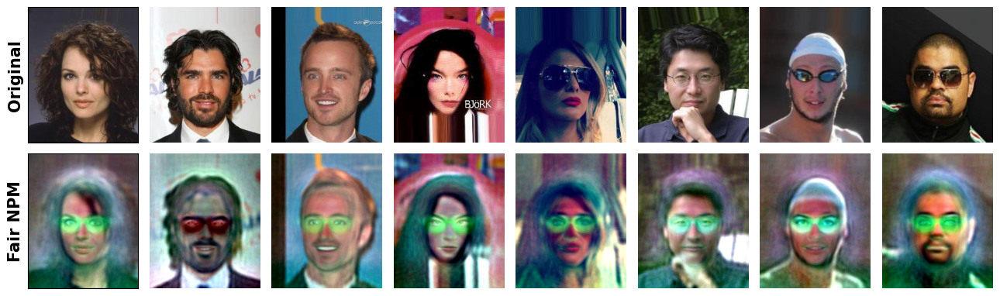

In [25]:
indices = [0,1,3,4,62,96,118,200]
fig, ax = plt.subplots(2, len(indices), figsize=(13, 4))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
# ax[1][0].set_ylabel('Vanilla NPM', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_val[index]
    print(label_example[pca_all.a]==1)
    projected_all = pca_all.transform(img_example).cpu()
    projected = pca_vanilla.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    # im_show(projected[0], ax[1][i])
    im_show(projected_all[0], ax[1][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        # ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        # ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        # ax[2][i].axis('off')
fig.tight_layout()
fig.savefig('comparison_celeba.pdf')

0it [00:00, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

0it [00:00, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

0it [00:00, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

0it [00:00, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

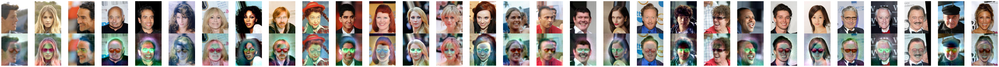

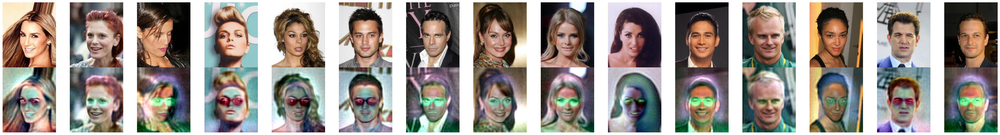

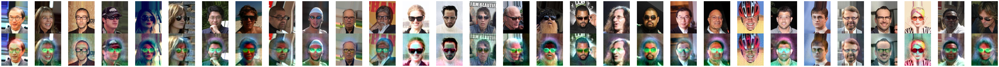

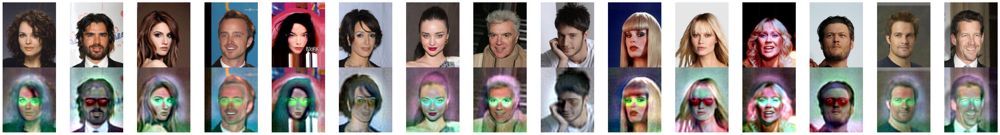

In [22]:
algo = 'fairAll1'
style = 'rgbFull'
comparison_figure(pca_all, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_all, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_all, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_all, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')

In [ ]:
stop

### Run PCA - Kleindessner

In [ ]:
from fair_streaming_pca_pytorch import FairStreamingPCA

pca_offline = FairStreamingPCA(TARGET_ATTR, device='cpu')
pca_offline.fit_offline(
    loader=loader_train,
    target_unfair_dim=None,
    target_pca_dim=1000,
    constraint='mean',
)

pca_offline.transform(loader=loader_val,)
print("Exp Var Ratio:", pca_offline.explained_variance_ratio)
print("Exp Var Ratio - Group 0:", pca_offline.explained_variance_ratio_group[0])
print("Exp Var Ratio - Group 1:", pca_offline.explained_variance_ratio_group[1])
print("Exp Var Ratio Difference:", pca_offline.explained_variance_ratio_group[0] - pca_offline.explained_variance_ratio_group[1])

Data Collection::   0%|          | 0/160 [00:00<?, ?it/s]

: 

: 

In [ ]:
img_example, label_example = next(iter(loader_val))
index = 14
print(label_example[index][pca_offline.a]==1)
projected = pca_offline.transform(img_example[index]).cpu()
fig, ax = plt.subplots(1,2)
im_show(projected[0], ax[0])
im_show(img_example[index], ax[1])
ax[0].title.set_text('PCA')
ax[1].title.set_text('Original')
fig.savefig('out_kleindessener_vanilla.pdf')

In [ ]:
algo = 'fairMeanOffline'
style = 'rgbFull'
comparison_figure(pca_offline, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_offline, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_offline, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_offline, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')